In [1]:
import matplotlib

# matplotlib.use("Agg")
# matplotlib.use("TkAgg")
from matplotlib.ticker import ScalarFormatter

import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from matplotlib.pyplot import cm
from matplotlib.patches import CirclePolygon
from matplotlib import colors
from mpl_toolkits.axes_grid1 import make_axes_locatable

import numpy as np
from scipy.special import erf
from scipy.optimize import minimize, minimize_scalar
import scipy.stats as st
from scipy import interpolate
# from scipy.interpolate import interp1d, interp2d, spline
import scipy as sp
import os,shutil,glob,sys

print(sp.__version__)

from astropy.table import Table
import csv
from collections import OrderedDict
import matplotlib.patheffects as path_effects

import scipy.ndimage as ndimage

from scipy.interpolate import griddata, interp2d
from matplotlib import ticker

import astropy.constants as c

1.16.3


In [2]:
bbh_files = glob.glob("/tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/*prob")

bbh_files.sort()
bbh_files

['/tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_0.prob',
 '/tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_1.prob',
 '/tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_10.prob',
 '/tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_11.prob',
 '/tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_12.prob',
 '/tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_13.prob',
 '/tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_14.prob',
 '/tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_15.prob',
 '/tf/nvmeold1/teglon_alloveragain

In [3]:
from astropy.table import Table, vstack

tables = []

for f_path in bbh_files:
    print(f"Loading {f_path}")
    tables.append(Table.read(f_path, format="ascii.ecsv"))

results_table = vstack(tables, metadata_conflicts="silent")

results_table.sort('Prob')
results_table.reverse()
results_table

Loading /tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_0.prob
Loading /tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_1.prob
Loading /tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_10.prob
Loading /tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_11.prob
Loading /tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_12.prob
Loading /tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_13.prob
Loading /tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_14.prob
Loading /tf/nvmeold1/teglon_alloveragain/teglon_O4/web/events/S240413p/model_detection/jrrII_bbh/Detection_jrrII_bbh_15.prob
Lo

type,v_kick,m_bh,M_smbh,R_bh,th_k_deg,Prob
str9,float64,float64,float64,float64,float64,float64
jrrII_bbh,400.0,160.0,100000000.0,3000.0,5.0,0.6993503260198346
jrrII_bbh,350.0,40.0,100000000.0,3000.0,15.0,0.6993503260198346
jrrII_bbh,500.0,40.0,10000000.0,10000.0,1.0,0.6993503260198346
jrrII_bbh,400.0,100.0,100000000.0,3000.0,15.0,0.6993503260198346
jrrII_bbh,500.0,20.0,100000000.0,1000.0,1.0,0.6993503260198346
jrrII_bbh,500.0,120.0,100000000.0,3000.0,15.0,0.6993503260198346
jrrII_bbh,300.0,150.0,100000000.0,3000.0,5.0,0.6993503260198346
jrrII_bbh,350.0,160.0,100000000.0,3000.0,5.0,0.6993503260198346
jrrII_bbh,500.0,120.0,10000000.0,30000.0,15.0,0.6993503260198346


In [4]:
bbh_LCS = glob.glob("/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_II_25/JRR_II_data/*")
print(len(bbh_LCS))
bbh_LCS

4320


['/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_II_25/JRR_II_data/JRRII_500_80_1000000000.0_3000_5_output.dat',
 '/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_II_25/JRR_II_data/JRRII_350_100_10000000.0_10000_15_output.dat',
 '/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_II_25/JRR_II_data/JRRII_150_40_100000000.0_9900_5_output.dat',
 '/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_II_25/JRR_II_data/JRRII_200_100_1000000.0_30000_5_output.dat',
 '/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_II_25/JRR_II_data/JRRII_200_140_100000000.0_9900_5_output.dat',
 '/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_II_25/JRR_II_data/JRRII_500_140_10000000.0_500_15_output.dat',
 '/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_II_25/JRR_II_data/JRRII_350_150_10000000.0_500_5_output.dat',
 '/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_II_25/JRR_II_data/JRRII_150_100_1000000000.0_500_15_output.dat',
 '/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_II_25/JRR_II_data/JRRII_350_120_1000000.0_6000_5_output.dat',
 '/tf/

In [5]:
import os
import pandas as pd
import matplotlib.pyplot as plt


def read_dat_with_metadata(filepath):
    """Read metadata and table from a .dat light curve file."""

    meta_lines = []
    data_start = 0

    with open(filepath) as f:
        for i, line in enumerate(f):
            if line.lstrip().startswith("#"):
                meta_lines.append(line.strip("# \n"))
            else:
                data_start = i
                break

    # -------- parse metadata into dict --------
    meta_dict = {}
    for line in meta_lines:
        if ":" in line:
            k, v = line.split(":", 1)
            meta_dict[k.strip()] = v.strip()

    # -------- read table --------
    df = pd.read_csv(filepath, sep=r"\s+", skiprows=data_start)


    return df


import os

def parse_filename_params(filepath):
    parameters = filepath.split('/')[-1].split('_')

    if len(parameters) >= 7 and parameters[0] == "JRRII":
        return {
            "vk_kms": float(parameters[1]),
            "M_BBH_Msun": float(parameters[2]),
            "M_SMBH_Msun": float(parameters[3]),
            "fas": float(parameters[4]),
            "theta_k_deg": float(parameters[5]),
        }

    return {}


import pandas as pd
import matplotlib.pyplot as plt


def plot_dat_lightcurves(files):

    param_rows = []
    plotted_any = False

    plt.figure(figsize=(9,6))

    for f in files:

        df = read_dat_with_metadata(f)
        params = parse_filename_params(f)

        # ---------- empty check ----------
        if len(df.dropna())==0:
            print("\nNo data — parameters used:")
            print(params)
            continue

        # ---------- plotting ----------
        df = df.dropna()
        t = df["time"].astype(float)
        mag_absolute_g = df['sdss_g'].astype(float)
        mag_absolute_r = df['sdss_r'].astype(float)
        mag_absolute_i = df['sdss_i'].astype(float)
        print(t,mag_absolute_g)

        plt.plot(t,mag_absolute_g)
        plt.show()
    # ---------- finalize plot ----------
    plt.xlabel("Time")
    plt.ylabel("Magnitude")
    plt.gca().invert_yaxis()
    plt.grid(alpha=0.3)
    plt.legend(fontsize=7)
    plt.tight_layout()
    plt.show()





In [6]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import AutoMinorLocator, MultipleLocator

# Constants
GW_DL = 526 * 1e6  # pc
mu_GW = 5 * np.log10(GW_DL / 10)

import cmasher as cmr

def plot_dat_lightcurves(files):

    fig, ax1 = plt.subplots(figsize=(10, 6))
    from matplotlib.ticker import ScalarFormatter

    # Disable scientific notation on y-axis
    ax1.ticklabel_format(style='plain', axis='y', useOffset=False)
    
    formatter = ScalarFormatter(useOffset=False)
    formatter.set_scientific(False)
    ax1.yaxis.set_major_formatter(formatter)

    plotted_any = False
    num_files = len(files)
    colors = cmr.wildfire(np.linspace(0.1, 0.8, num_files))
    i=0
    for f in files:

        df = read_dat_with_metadata(f)
        params = parse_filename_params(f)

        df_clean = df.dropna(subset=['time', 'sdss_g']).copy()
        if df_clean.empty:
            continue

        t = pd.to_numeric(df_clean["time"])
        mag_abs = pd.to_numeric(df_clean['sdss_g'])

        label_str = (
            f"vk={params.get('vk_kms')}  \n "
            f"M_BBH={params.get('M_BBH_Msun')} \n "
            f"M_SMBH/10**8={params.get('M_SMBH_Msun')/10**8} \n  "
            f"R_BH={params.get('fas')} \n "
            f"θ_k={params.get('theta_k_deg')}"
        )
        
        tmin = t.min()

        # Style rule
        linestyle = '-' if tmin < 50 else '--'
        
        ax1.plot(
            t,
            mag_abs,
            linewidth=2.5,
            linestyle=linestyle,
            alpha=0.9,
            label=label_str,
            color=colors[i]
        )


        # ax1.plot(
        #     t,
        #     mag_abs,
        #     linewidth=2.5,        # thicker curve
        #     alpha=0.9,
        #     label=label_str
        # )

        plotted_any = True
        i=i+1

    if not plotted_any:
        print("No valid data found to plot.")
        return

    # ==============================
    # Axis Labels (Larger Font)
    # ==============================
    ax1.set_xlabel("Time (days)", fontsize=16)
    ax1.set_ylabel("Absolute Magnitude (M)", fontsize=16)

    # ==============================
    # Tick Styling
    # ==============================
    ax1.tick_params(
        axis='both',
        which='major',
        labelsize=14,
        width=1.5,
        length=7
    )

    ax1.tick_params(
        axis='both',
        which='minor',
        width=1.2,
        length=4
    )

    # Major tick spacing
    ax1.xaxis.set_major_locator(MultipleLocator(50))
    ax1.xaxis.set_minor_locator(AutoMinorLocator(5))

    ax1.yaxis.set_minor_locator(AutoMinorLocator(5))

    # ==============================
    # Grid
    # ==============================
    ax1.grid(True, which='major', linestyle='--', alpha=0.5)
    ax1.grid(True, which='minor', linestyle=':', alpha=0.3)

    ax1.invert_yaxis()
    ax1.set_xlim(0, 400)

    # ==============================
    # Twin Axis (Apparent Mag)
    # ==============================
    ax2 = ax1.twinx()

    y1, y2 = ax1.get_ylim()
    ax2.set_ylim(y1 + mu_GW, y2 + mu_GW)

    ax2.set_ylabel("Apparent Magnitude (m)", fontsize=16)

    ax2.tick_params(
        axis='y',
        which='major',
        labelsize=14,
        width=1.5,
        length=7
    )

    ax2.yaxis.set_minor_locator(AutoMinorLocator(5))

    # ==============================
    # Legend
    # ==============================
    ax1.legend(
        fontsize=10,
        frameon=True,
        loc='upper left',
        bbox_to_anchor=(1.11, 1)
    )

    plt.tight_layout()
    plt.show()


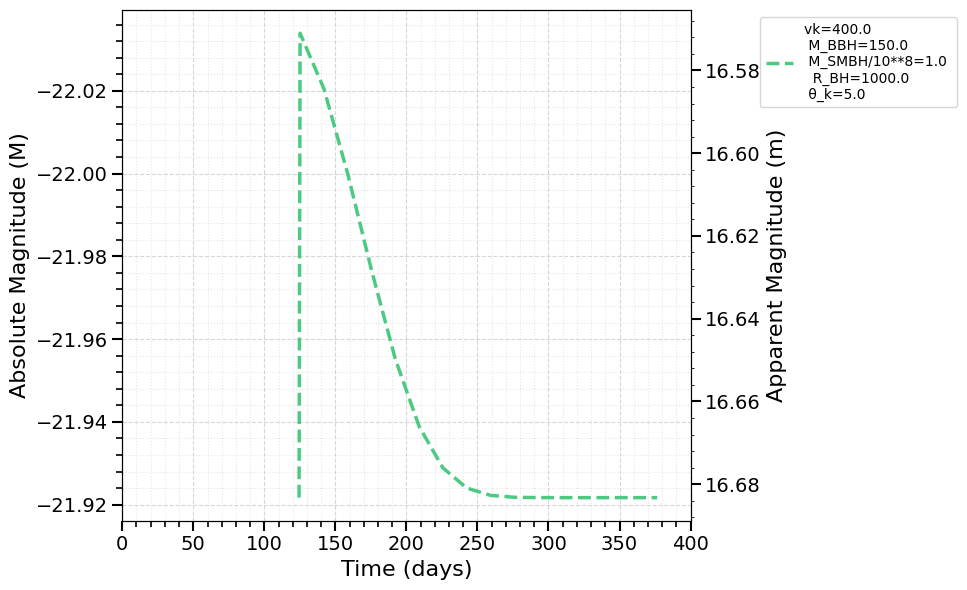

In [7]:
plot_dat_lightcurves(bbh_LCS[700:701])


# Selecting the high prob regions

In [11]:
#results_table0 = results_table[(results_table['v_kick']>300.0)&(results_table['m_bh']>60)&(results_table['M_smbh']==10**7)]
results_table0 = results_table
results_table0.sort('Prob')
results_table0.reverse()
results_table0[results_table0['Prob']>0.5]

type,v_kick,m_bh,M_smbh,R_bh,th_k_deg,Prob
str9,float64,float64,float64,float64,float64,float64
jrrII_bbh,400.0,20.0,100000000.0,500.0,5.0,0.6993503260198346
jrrII_bbh,350.0,20.0,100000000.0,500.0,1.0,0.6993503260198346
jrrII_bbh,300.0,100.0,100000000.0,1000.0,1.0,0.6993503260198346
jrrII_bbh,350.0,20.0,100000000.0,1000.0,5.0,0.6993503260198346
jrrII_bbh,500.0,140.0,100000000.0,3000.0,15.0,0.6993503260198346
jrrII_bbh,150.0,20.0,10000000.0,10000.0,1.0,0.6993503260198346
jrrII_bbh,500.0,40.0,10000000.0,10000.0,5.0,0.6993503260198346
jrrII_bbh,500.0,150.0,100000000.0,1000.0,5.0,0.6993503260198346
jrrII_bbh,500.0,60.0,100000000.0,1000.0,5.0,0.6993503260198346


In [12]:
import os

def build_bbh_file_list(df,
                        base_path='/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_II_25/JRR_II_data'):

    file_list = []

    for _, row in df.iterrows():

        # ---- Extract parameters ----
        vks0 = int(row['v_kick'])
        M_BBHs0 = int(row['m_bh'])
        M_SMBHs0 = float(row['M_smbh'])
        fas0 = int(row['R_bh'])
        th_k0 = int(row['th_k_deg'])

        # ---- Preserve formatting consistency ----
        # SMBH mass may appear as 10000000.0 in filenames
        filename = (
            f"JRRII_{vks0}_{M_BBHs0}_{M_SMBHs0}_{fas0}_{th_k0}_output.dat"
        )

        full_path = os.path.join(base_path, filename)

        file_list.append(full_path)

    return file_list


In [14]:
results_table0 = results_table
results_table0.sort('Prob')
results_table0.reverse()

high_prob_df = results_table0[results_table0['Prob'] < 0.5]

high_prob_df = high_prob_df.to_pandas()

new_list = build_bbh_file_list(high_prob_df)

plot_dat_lightcurves(new_list)


/tmp/ipykernel_562418/2382580956.py:148: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [ ]:
print(len(new_list))

/tmp/ipykernel_562418/2382580956.py:148: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


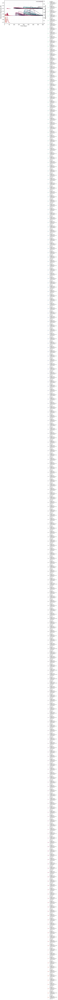

In [15]:
import pandas as pd

#results_table0 = results_table[(results_table['v_kick']>350.0)&(results_table['m_bh']<40)&(results_table['M_smbh']==10**6)]
#results_table0 = results_table[(results_table['m_bh']>120)&(results_table['M_smbh']==10**7)]
results_table0 = results_table
results_table0.sort('Prob')
results_table0.reverse()

high_prob_df = results_table0[results_table0['Prob'] > 0.5]

high_prob_df = high_prob_df.to_pandas()

new_list = build_bbh_file_list(high_prob_df)

plot_dat_lightcurves(new_list)


In [16]:
len(new_list)

232

In [144]:
print(results_table['R_bh'], np.log10(results_table['R_bh']))

  R_bh 
-------
 3000.0
 3000.0
10000.0
 3000.0
 1000.0
 3000.0
 3000.0
 3000.0
30000.0
  500.0
    ...
 3000.0
10000.0
 3000.0
10000.0
 6000.0
 1000.0
  500.0
 3000.0
  500.0
 3000.0
Length = 4320 rows        R_bh       
------------------
3.4771212547196626
3.4771212547196626
               4.0
3.4771212547196626
               3.0
3.4771212547196626
3.4771212547196626
3.4771212547196626
 4.477121254719663
2.6989700043360187
               ...
3.4771212547196626
               4.0
3.4771212547196626
               4.0
 3.778151250383644
               3.0
2.6989700043360187
3.4771212547196626
2.6989700043360187
3.4771212547196626
Length = 4320 rows


No valid data found to plot.


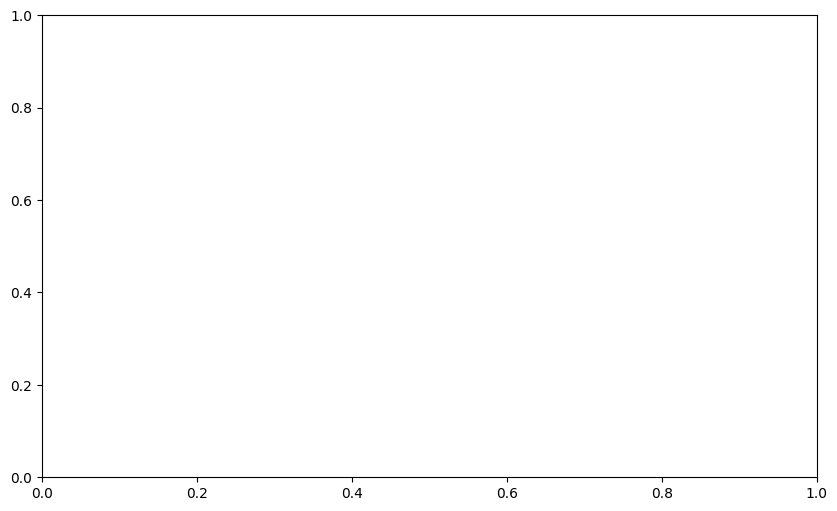

In [145]:
import pandas as pd

#results_table0 = results_table[(results_table['v_kick']>350.0)&(results_table['m_bh']<40)&(results_table['M_smbh']==10**6)]
results_table0 = results_table[(results_table['R_bh']>=3000.0)&(results_table['M_smbh']==10**8)&(results_table['R_bh']<=500.0)]

results_table0.sort('Prob')
results_table0.reverse()

high_prob_df = results_table0[results_table0['Prob'] > 0.5]

high_prob_df = high_prob_df.to_pandas()

new_list = build_bbh_file_list(high_prob_df)

plot_dat_lightcurves(new_list)


In [146]:
np.log10(30000)

4.477121254719663

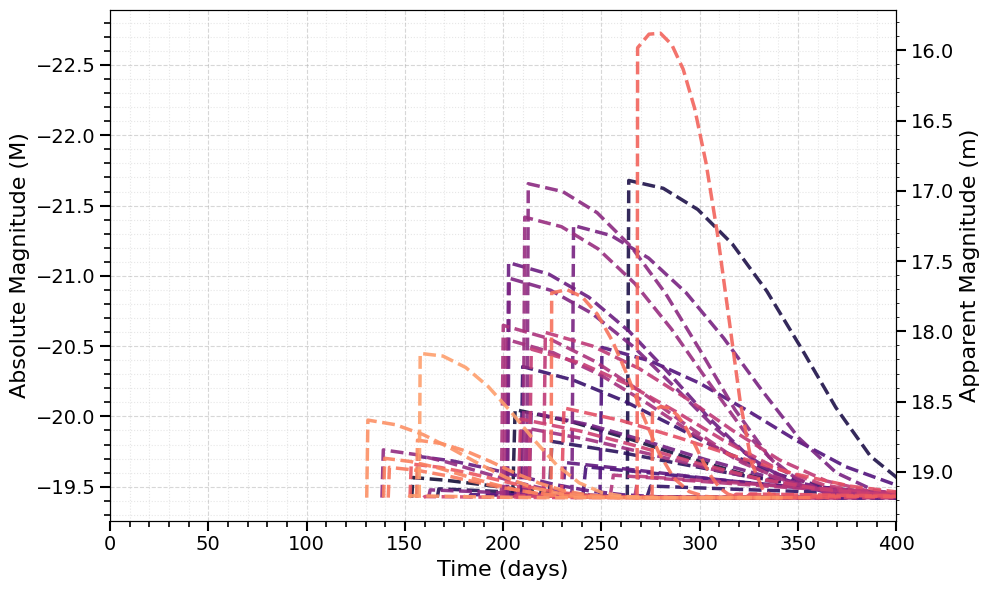

In [147]:
import pandas as pd

#results_table0 = results_table[(results_table['v_kick']>350.0)&(results_table['m_bh']<40)&(results_table['M_smbh']==10**6)]
results_table0 = results_table[(results_table['R_bh']>=10**3.8)&(results_table['M_smbh']==10**7)&(results_table['R_bh']<10**4.4)]

results_table0.sort('Prob')
results_table0.reverse()

high_prob_df = results_table0[results_table0['Prob'] > 0.5]

high_prob_df = high_prob_df.to_pandas()

new_list = build_bbh_file_list(high_prob_df)

plot_dat_lightcurves(new_list)


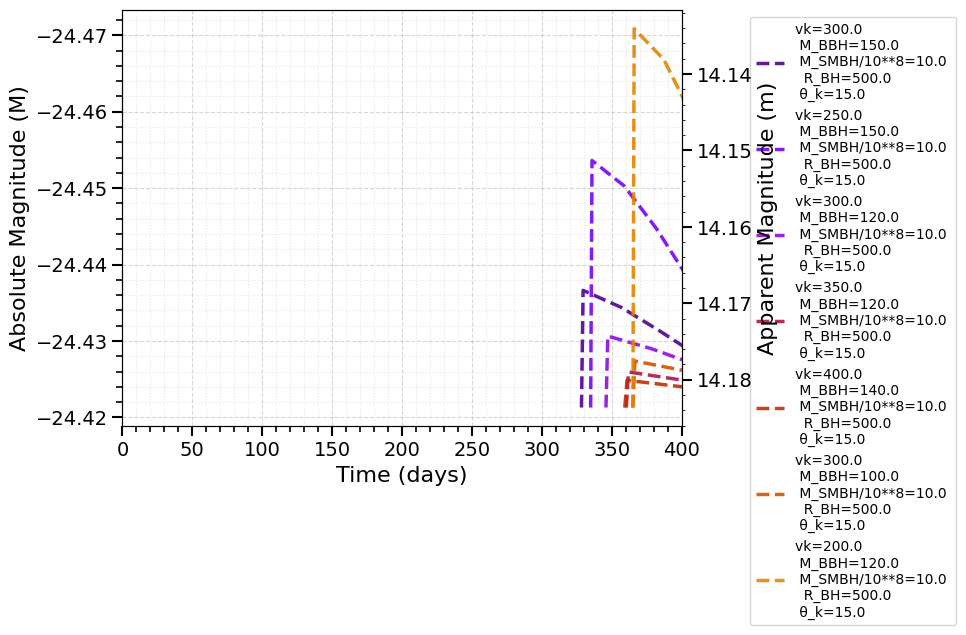

In [196]:
import pandas as pd

results_table0 = results_table[(results_table['v_kick']>0)&(results_table['M_smbh']==10**9)&(results_table['th_k_deg']>0.0)]

results_table0.sort('Prob')
results_table0.reverse()

high_prob_df = results_table0[results_table0['Prob'] > 0.5]

high_prob_df = high_prob_df.to_pandas()

new_list = build_bbh_file_list(high_prob_df)

plot_dat_lightcurves(new_list)


/tmp/ipykernel_47263/2382580956.py:148: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


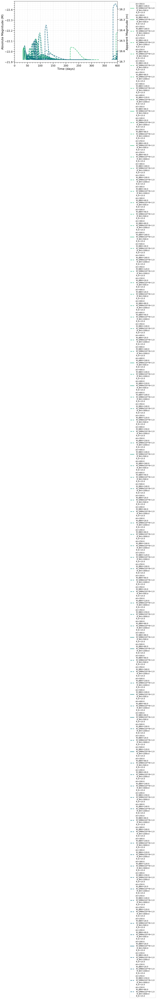

In [208]:
import pandas as pd

#results_table0 = results_table[(results_table['v_kick']>0)&(results_table['M_smbh']==10**8)&(results_table['th_k_deg']==1)]
results_table0 = results_table[(results_table['v_kick']>0)&(results_table['M_smbh']==10**8)&(results_table['th_k_deg']==15)]

results_table0.sort('Prob')
results_table0.reverse()

high_prob_df = results_table0[results_table0['Prob'] < 0.5]

high_prob_df = high_prob_df.to_pandas()

new_list = build_bbh_file_list(high_prob_df)

plot_dat_lightcurves(new_list)


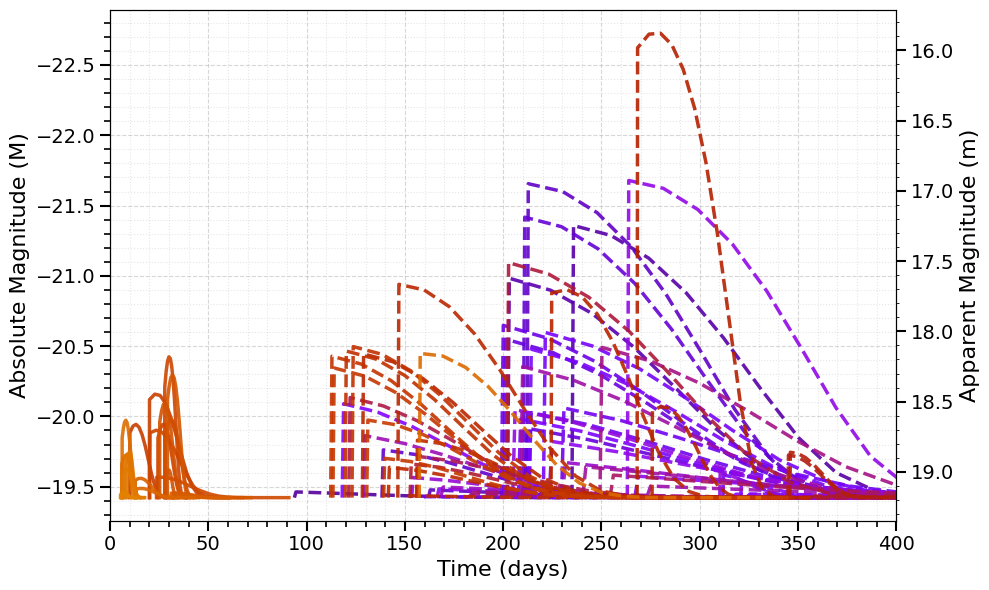

In [162]:
import pandas as pd

results_table0 = results_table[(results_table['v_kick']>0)&(results_table['M_smbh']==10**7)]

results_table0.sort('Prob')
results_table0.reverse()

high_prob_df = results_table0[results_table0['Prob'] > 0.5]

high_prob_df = high_prob_df.to_pandas()

new_list = build_bbh_file_list(high_prob_df)

plot_dat_lightcurves(new_list)


# RBH - Analysis

In [166]:
import numpy as np

def rbh_pc(log10_rbh_over_rg, M_smbh_solar):
    """
    Parameters
    ----------
    log10_rbh_over_rg : float or array
        log10(R_BH / R_g)
    M_smbh_solar : float or array
        SMBH mass in solar masses

    Returns
    -------
    R_BH in parsecs
    """

    # Physical constants
    G = 6.67430e-11           # m^3 kg^-1 s^-2
    c = 2.99792458e8          # m/s
    M_sun = 1.98847e30        # kg
    pc = 3.085677581e16       # meters

    # Convert mass to kg
    M = M_smbh_solar * M_sun

    # Gravitational radius in meters
    R_g = G * M / c**2

    # R_BH in meters
    R_BH_m = (10**log10_rbh_over_rg) * R_g

    # Convert to parsecs
    R_BH_pc = R_BH_m / pc

    print('parsec Radius:', R_BH_pc)

    return R_BH_pc


In [168]:
rbh_pc(3.4, 10**8)
rbh_pc(2.8, 10**8)

rbh_pc(4.4, 10**7)
rbh_pc(3.8, 10**7)

parsec Radius: 0.012020784619779559
parsec Radius: 0.0030194845782523317
parsec Radius: 0.012020784619779571
parsec Radius: 0.0030194845782523317


0.0030194845782523317

In [169]:
rbh_pc(4.0, 10**7)

parsec Radius: 0.004785560552813439


0.004785560552813439

In [172]:
np.unique(results_table['R_bh']).size


7

In [174]:
unique_vals, counts = np.unique(results_table['R_bh'], return_counts=True)
for val, count in zip(unique_vals, counts):
    print(val, count, np.log10(val))


500.0 864 2.6989700043360187
1000.0 864 3.0
3000.0 864 3.4771212547196626
6000.0 648 3.778151250383644
9900.0 216 3.99563519459755
10000.0 432 4.0
30000.0 432 4.477121254719663


/tmp/ipykernel_47263/805662249.py:147: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


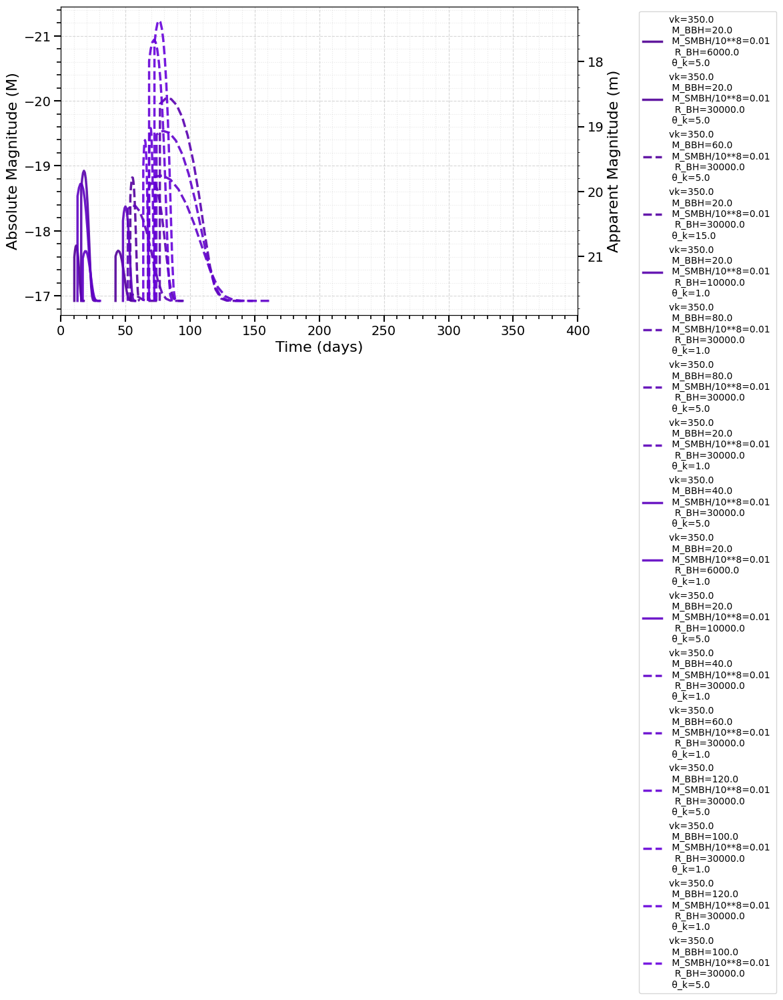

In [189]:
import pandas as pd

results_table0 = results_table[(results_table['v_kick']==350)&(results_table['M_smbh']==10**6)]

results_table0.sort('Prob')
results_table0.reverse()

high_prob_df = results_table0[results_table0['Prob'] < 0.01]

high_prob_df = high_prob_df.to_pandas()

new_list = build_bbh_file_list(high_prob_df)

plot_dat_lightcurves(new_list)


# Calculating the Properties of the Detectable and the not detectable ones:

In [214]:
# Constants
GW_DL = 526 * 1e6  # pc
mu_GW = 5 * np.log10(GW_DL / 10)
from scipy import interpolate

import cmasher as cmr

def calculate_properties_BBH(files):
    num_files = len(files)
    i=0
    for f in files:
        df = read_dat_with_metadata(f)
        params = parse_filename_params(f)

        df_clean = df.dropna(subset=['time', 'sdss_g']).copy()
        if df_clean.empty:
            continue

        t = pd.to_numeric(df_clean["time"])
        mag_abs_g = pd.to_numeric(df_clean['sdss_g'])
        mag_abs_i = pd.to_numeric(df_clean['sdss_i'])
        mag_abs_r = pd.to_numeric(df_clean['sdss_r'])

        #calculate peak magnitude:
        peak_g_abs = np.min(mag_abs_g)
        peak_g_app = peak_g_abs+mu_GW

        peak_r_abs = np.min(mag_abs_r)
        peak_r_app = peak_r_abs+mu_GW

        peak_i_abs = np.min(mag_abs_i)
        peak_i_app = peak_i_abs+mu_GW

        #calculate the properties of the flare,
        mag0 = np.array(mag_abs_g+mu_GW)
        time_mjd0 = np.array(t)
        f_interp = interpolate.interp1d(t, mag_abs_g+mu_GW, kind='linear', bounds_error=False, fill_value='extrapolate')
        idx_peak = np.argmin(mag0)  # brightest point
        t_peak = time_mjd0[idx_peak]
        m_peak = mag0[idx_peak]
        m_half = m_peak + 0.752  # half-flux magnitude
        delay = t.min()

        # --- Find rise and fade times by interpolation ---
        # Rise: time before peak when mag crosses m_half
        mask_rise = time_mjd0 <= t_peak
        if np.any(mask_rise):
            t_rise_candidates = time_mjd0[mask_rise]
            mags_rise = mag0[mask_rise]
            # Interpolate to find exact crossing
            try:
                f_rise = interp1d(mags_rise[::-1], t_rise_candidates[::-1], kind='linear', bounds_error=False)
                t_rise_half = f_rise(m_half)
            except:
                t_rise_half = np.nan
        else:
            t_rise_half = np.nan
        
        # Fade: time after peak when mag crosses m_half
        mask_fade = time_mjd0 >= t_peak
        if np.any(mask_fade):
            t_fade_candidates = time_mjd0[mask_fade]
            mags_fade = mag0[mask_fade]
            try:
                f_fade = interp1d(mags_fade, t_fade_candidates, kind='linear', bounds_error=False)
                t_fade_half = f_fade(m_half)
            except:
                t_fade_half = np.nan
        else:
            t_fade_half = np.nan
        
        # --- Duration above half-flux ---
        if np.isfinite(t_rise_half) and np.isfinite(t_fade_half):
            duration = t_fade_half - t_rise_half
        else:
            duration = np.nan
        
        print(f"t_rise_half = {t_rise_half:.2f} days before peak")
        print(f"t_fade_half = {t_fade_half:.2f} days after peak")
        print(f"Duration above half-maximum: {duration:.2f} days",t_rise_half-t_peak,t_fade_half-t_peak)
        

        label_str = (
            f"vk={params.get('vk_kms')}  \n "
            f"M_BBH={params.get('M_BBH_Msun')} \n "
            f"M_SMBH/10**8={params.get('M_SMBH_Msun')/10**8} \n  "
            f"R_BH={params.get('fas')} \n "
            f"θ_k={params.get('theta_k_deg')}"
        )
        
        i=i+1




In [234]:
import numpy as np
import pandas as pd
from scipy.interpolate import interp1d

# ============================================================
# CONSTANTS
# ============================================================

GW_DL = 526 * 1e6  # pc
mu_GW = 5 * np.log10(GW_DL / 10)


# ============================================================
# FIND HALF FLUX TIME (DECAY ONLY)
# ============================================================

def find_half_time_decay(time, mag, m_half):
    """
    Find time when magnitude crosses half-flux AFTER peak.
    Uses robust linear interpolation between points.

    Returns np.nan if not found.
    """

    if len(time) < 2:
        return np.nan

    for i in range(len(time) - 1):

        m1 = mag[i]
        m2 = mag[i+1]

        if (m1 <= m_half and m2 >= m_half) or (m1 >= m_half and m2 <= m_half):

            t1 = time[i]
            t2 = time[i+1]

            if m2 == m1:
                return t1

            return t1 + (t2 - t1) * (m_half - m1) / (m2 - m1)

    return np.nan


# ============================================================
# COMPUTE FLARE PROPERTIES
# ============================================================

def compute_flare_properties(time, mag_app):
    """
    Compute BBH flare properties from apparent magnitude light curve.

    Definitions:

    delay = t_peak - t_GW

    duration = t_half_decay - t_GW
    """

    mask = np.isfinite(time) & np.isfinite(mag_app)

    time = time[mask]
    mag = mag_app[mask]

    if len(time) < 3:
        return None

    order = np.argsort(time)

    time = time[order]
    mag = mag[order]

    # reference time (GW event)
    t_gw = time.min()

    # peak
    idx_peak = np.argmin(mag)

    t_peak = time[idx_peak]
    m_peak = mag[idx_peak]

    # half-flux magnitude
    m_half = m_peak + 0.7526

    # decay half time
    t_decay_half = find_half_time_decay(
        time[idx_peak:],
        mag[idx_peak:],
        m_half
    )

    # delay
    delay = t_gw

    # duration
    if np.isfinite(t_decay_half):
        duration = t_decay_half - t_gw
        decay_time = t_decay_half - t_peak
    else:
        duration = np.nan
        decay_time = np.nan

    return dict(

        t_peak=t_peak,
        peak_mag=m_peak,

        delay=delay,
        duration=duration,
        decay_time=decay_time,

        t_half_decay=t_decay_half,

    )


# ============================================================
# MAIN FUNCTION
# ============================================================

def calculate_properties_BBH(files):

    results = []

    for f in files:

        df = read_dat_with_metadata(f)
        params = parse_filename_params(f)
        
        df = df.dropna(subset=['time', 'sdss_g']).copy()
        if df.empty:
            continue

        time = pd.to_numeric(
            df["time"],
            errors="coerce"
        ).values

        bands = {

            "g": pd.to_numeric(
                df["sdss_g"],
                errors="coerce"
            ).values + mu_GW,

            "r": pd.to_numeric(
                df["sdss_r"],
                errors="coerce"
            ).values + mu_GW,

            "i": pd.to_numeric(
                df["sdss_i"],
                errors="coerce"
            ).values + mu_GW,
        }

        properties = {}

        # ----------------------------------------------------
        # Compute flare properties per band
        # ----------------------------------------------------

        for band in ["g", "r", "i"]:

            flare = compute_flare_properties(
                time,
                bands[band]
            )

            if flare is None:
                continue

            properties[f"peak_mag_{band}"] = flare["peak_mag"]

            properties[f"delay_{band}"] = flare["delay"]

            properties[f"duration_{band}"] = flare["duration"]

            properties[f"decay_time_{band}"] = flare["decay_time"]

            properties[f"t_peak_{band}"] = flare["t_peak"]

            properties[f"t_half_decay_{band}"] = flare["t_half_decay"]

        # ----------------------------------------------------
        # Add simulation parameters
        # ----------------------------------------------------

        properties.update({

            "vkick_kms":
                params.get("vk_kms"),

            "M_remnant_Msun":
                params.get("M_BBH_Msun"),

            "M_SMBH_Msun":
                params.get("M_SMBH_Msun"),

            "R_BH_Rg":
                params.get("fas"),

            "theta_kick_deg":
                params.get("theta_k_deg"),

            "filename":
                f

        })

        results.append(properties)

    return pd.DataFrame(results)



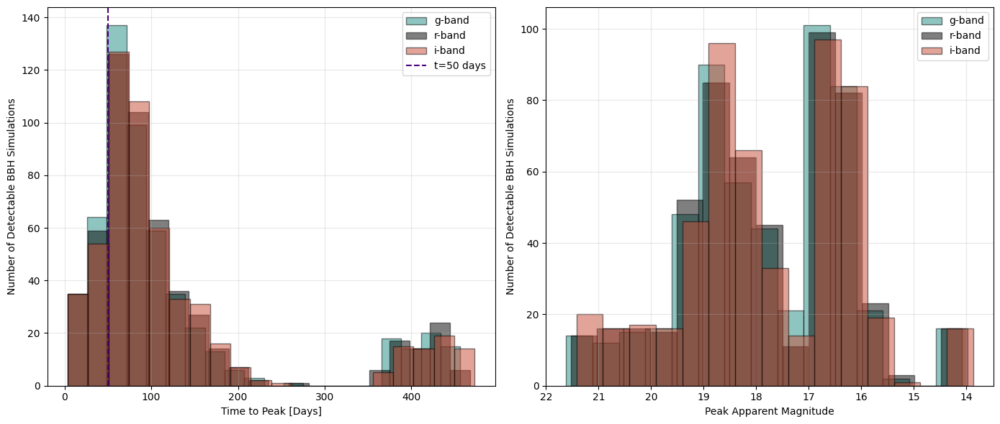

In [261]:

import pandas as pd

#results_table0 = results_table[(results_table['v_kick']>350.0)&(results_table['m_bh']<40)&(results_table['M_smbh']==10**6)]
results_table0 = results_table

results_table0.sort('Prob')
results_table0.reverse()

high_prob_df = results_table0[results_table0['Prob'] < 0.5]

high_prob_df = high_prob_df.to_pandas()

new_list = build_bbh_file_list(high_prob_df)

#plot_dat_lightcurves(new_list)

df_results = calculate_properties_BBH(new_list)
df_results = df_results[['peak_mag_g', 'delay_g','t_peak_g','peak_mag_r', 'delay_r',
            't_peak_r','peak_mag_i', 'delay_i','t_peak_i','vkick_kms',
       'M_remnant_Msun', 'M_SMBH_Msun', 'R_BH_Rg', 'theta_kick_deg',
       'filename']]

# plot_bbh_histograms(df_results)


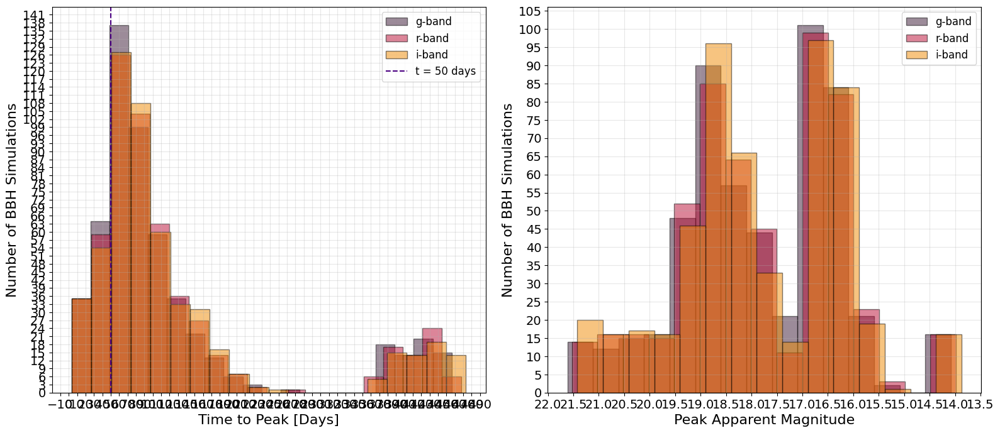

In [268]:
plot_bbh_histograms(df_results)

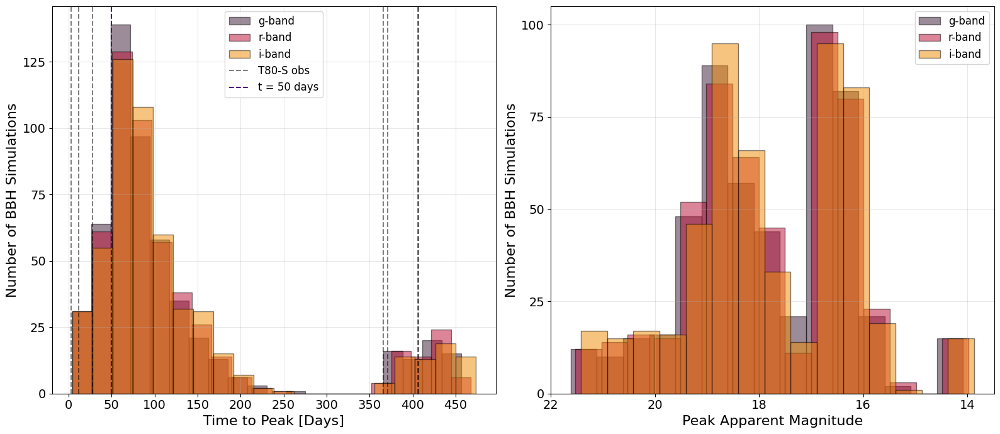

In [306]:

import pandas as pd

#results_table0 = results_table[(results_table['v_kick']>350.0)&(results_table['m_bh']<40)&(results_table['M_smbh']==10**6)]
results_table0 = results_table

results_table0.sort('Prob')
results_table0.reverse()

high_prob_df = results_table0[results_table0['Prob'] < 0.01]

high_prob_df = high_prob_df.to_pandas()

new_list = build_bbh_file_list(high_prob_df)

#plot_dat_lightcurves(new_list)

df_results = calculate_properties_BBH(new_list)
df_results = df_results[['peak_mag_g', 'delay_g','t_peak_g','peak_mag_r', 'delay_r',
            't_peak_r','peak_mag_i', 'delay_i','t_peak_i','vkick_kms',
       'M_remnant_Msun', 'M_SMBH_Msun', 'R_BH_Rg', 'theta_kick_deg',
       'filename']]

plot_bbh_histograms(df_results)

In [307]:
df_results

,peak_mag_g,delay_g,t_peak_g,peak_mag_r,delay_r,t_peak_r,peak_mag_i,delay_i,t_peak_i,vkick_kms,M_remnant_Msun,M_SMBH_Msun,R_BH_Rg,theta_kick_deg,filename
0,20.755725,7.280464,7.734911,20.901232,7.280464,7.847331,20.954801,7.280464,7.847331,500.0,40.0,1000000.0,6000.0,5.0,/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_I...
1,18.856729,13.869719,16.336835,18.802496,13.869719,17.544769,18.735052,13.869719,17.544769,300.0,20.0,10000000.0,1000.0,5.0,/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_I...
2,19.120451,6.402299,7.042190,19.037831,6.402299,7.200484,18.928926,6.402299,7.200484,400.0,20.0,10000000.0,1000.0,15.0,/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_I...
3,19.123539,3.764280,4.186660,19.041373,3.764280,4.186660,18.932361,3.764280,4.186660,500.0,40.0,10000000.0,500.0,15.0,/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_I...
4,16.576731,33.112096,36.373007,16.500856,33.112096,36.373007,16.400801,33.112096,37.444820,300.0,60.0,100000000.0,500.0,15.0,/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_I...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
527,18.870442,45.168222,49.405483,18.780746,45.168222,53.470290,18.698952,45.168222,53.470290,250.0,20.0,10000000.0,3000.0,5.0,/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_I...
528,16.607115,397.115888,398.272811,16.486856,397.115888,398.272811,16.367919,397.115888,425.541744,250.0,140.0,100000000.0,3000.0,15.0,/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_I...
529,16.625644,398.309763,399.562213,16.507276,398.309763,399.562213,16.387577,398.309763,429.082729,250.0,120.0,100000000.0,3000.0,15.0,/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_I...
530,15.914894,420.406564,422.066594,15.674597,420.406564,422.066594,15.551676,420.406564,461.193889,250.0,150.0,100000000.0,3000.0,1.0,/tf/astrodados/phelipedata/Follow-UP/BBH/JRR_I...



Pearson correlation matrix:

                peak_mag_g   delay_g  t_peak_g  peak_mag_r   delay_r  \
peak_mag_g        1.000000 -0.369213 -0.369553    0.998471 -0.369213   
delay_g          -0.369213  1.000000  0.999822   -0.378821  1.000000   
t_peak_g         -0.369553  0.999822  1.000000   -0.378807  0.999822   
peak_mag_r        0.998471 -0.378821 -0.378807    1.000000 -0.378821   
delay_r          -0.369213  1.000000  0.999822   -0.378821  1.000000   
t_peak_r         -0.377924  0.998027  0.998036   -0.387359  0.998027   
peak_mag_i        0.996709 -0.383968 -0.383705    0.999485 -0.383968   
delay_i          -0.369213  1.000000  0.999822   -0.378821  1.000000   
t_peak_i         -0.389563  0.994926  0.994631   -0.400985  0.994926   
vkick_kms         0.330681 -0.346275 -0.350698    0.335353 -0.346275   
M_remnant_Msun   -0.324460  0.188396  0.186756   -0.333784  0.188396   
theta_kick_deg   -0.209496  0.194010  0.196602   -0.187049  0.194010   
log_M_SMBH       -0.942061  0.3592

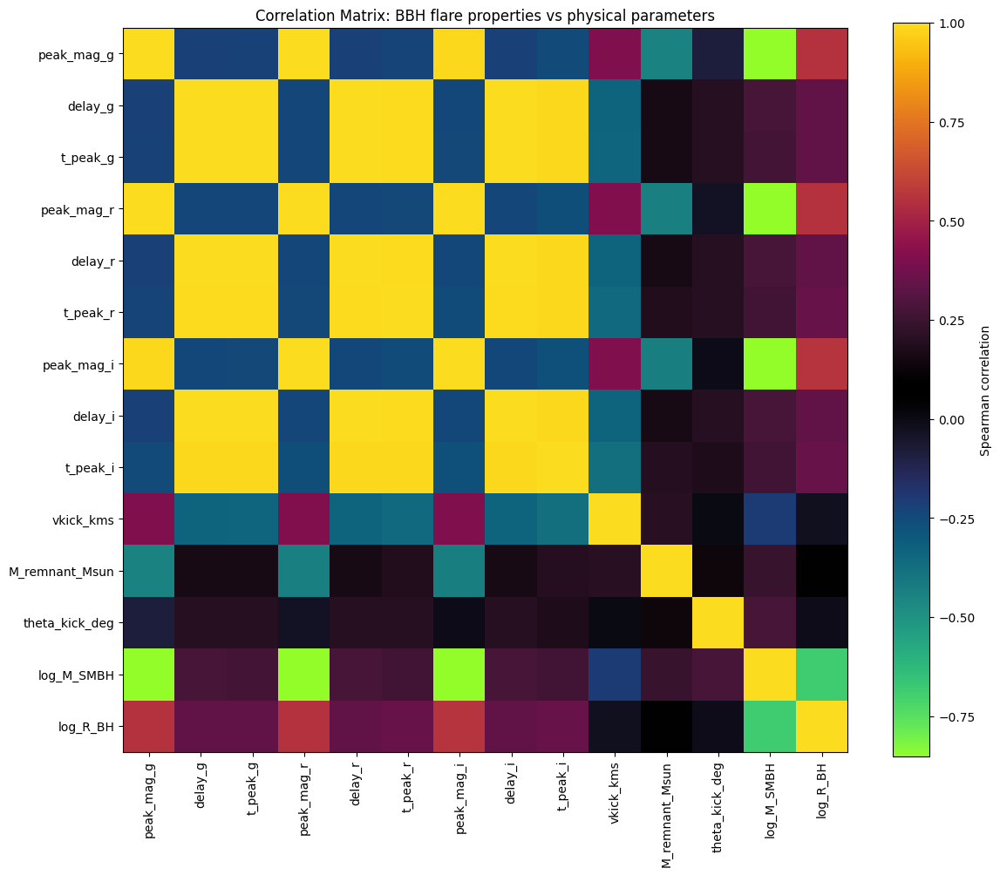

In [296]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------
# Select parameters of interest
# -----------------------------
cols = [
    'peak_mag_g', 'delay_g','t_peak_g',
    'peak_mag_r', 'delay_r','t_peak_r',
    'peak_mag_i', 'delay_i','t_peak_i',
    'vkick_kms',
    'M_remnant_Msun',
    'M_SMBH_Msun',
    'R_BH_Rg',
    'theta_kick_deg'
]

df_corr = df_results[cols].copy()

# -----------------------------
# Clean data
# -----------------------------
df_corr = df_corr.apply(pd.to_numeric, errors='coerce')

df_corr.replace([np.inf, -np.inf], np.nan, inplace=True)

df_corr.dropna(inplace=True)

# -----------------------------
# Log scale astrophysical parameters
# (physically meaningful)
# -----------------------------
df_corr["log_M_SMBH"] = np.log10(df_corr["M_SMBH_Msun"].astype(float))
df_corr["log_R_BH"] = np.log10(df_corr["R_BH_Rg"])

# Remove original linear versions if desired
df_corr = df_corr.drop(columns=[
    "M_SMBH_Msun",
    "R_BH_Rg"
])

# -----------------------------
# Compute correlation matrices
# -----------------------------

# Pearson (linear relationships)
corr_pearson = df_corr.corr(method="pearson")

# Spearman (recommended for astrophysics)
corr_spearman = df_corr.corr(method="spearman")

print("\nPearson correlation matrix:\n")
print(corr_pearson)

print("\nSpearman correlation matrix:\n")
print(corr_spearman)

# -----------------------------
# Plot correlation matrix
# -----------------------------

import cmasher as cmr

plt.figure(figsize=(12,10))

# Use cmasher's wildfire colormap
im = plt.imshow(corr_spearman, cmap=cmr.wildfire)

plt.colorbar(im, label="Spearman correlation")

plt.xticks(
    range(len(corr_spearman.columns)),
    corr_spearman.columns,
    rotation=90
)

plt.yticks(
    range(len(corr_spearman.columns)),
    corr_spearman.columns
)

plt.title("Correlation Matrix: BBH flare properties vs physical parameters")

plt.tight_layout()
plt.show()


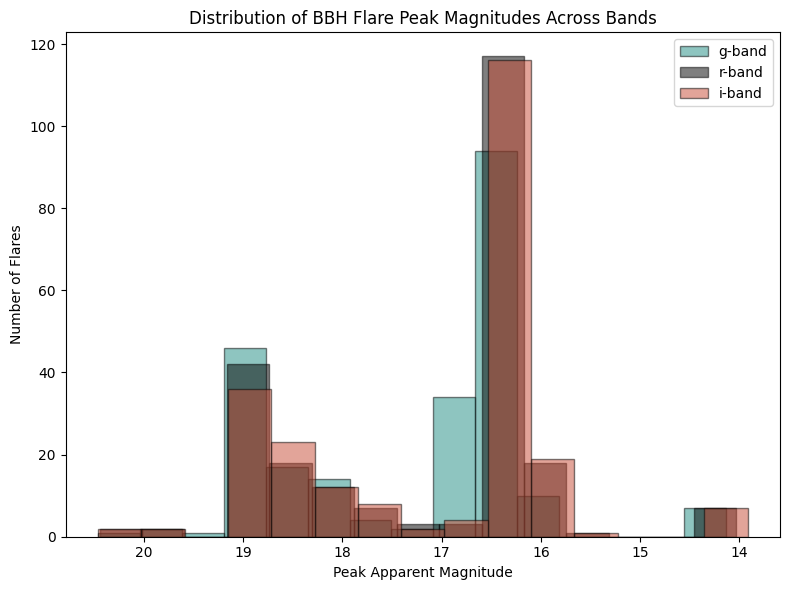

In [252]:
import matplotlib.pyplot as plt

# Assuming df_results contains columns: 'peak_mag_g', 'peak_mag_r', 'peak_mag_i'
bands = ['g', 'r', 'i']
import cmasher as cmr
colors = [cmr.wildfire(0.2), cmr.wildfire(0.5), cmr.wildfire(0.8)]

plt.figure(figsize=(8,6))

# Plot histogram for each band
for band, color in zip(bands, colors):
    plt.hist(
        df_results[f'peak_mag_{band}'].dropna(),
        bins=15,            # adjust bins as needed
        alpha=0.5,          # transparency for overlapping
        label=f'{band}-band',
        color=color,
        edgecolor='k'
    )

plt.xlabel("Peak Apparent Magnitude")
plt.ylabel("Number of Flares")
plt.title("Distribution of BBH Flare Peak Magnitudes Across Bands")
plt.gca().invert_xaxis()  # brighter magnitudes to the left
plt.legend()
plt.tight_layout()
plt.show()


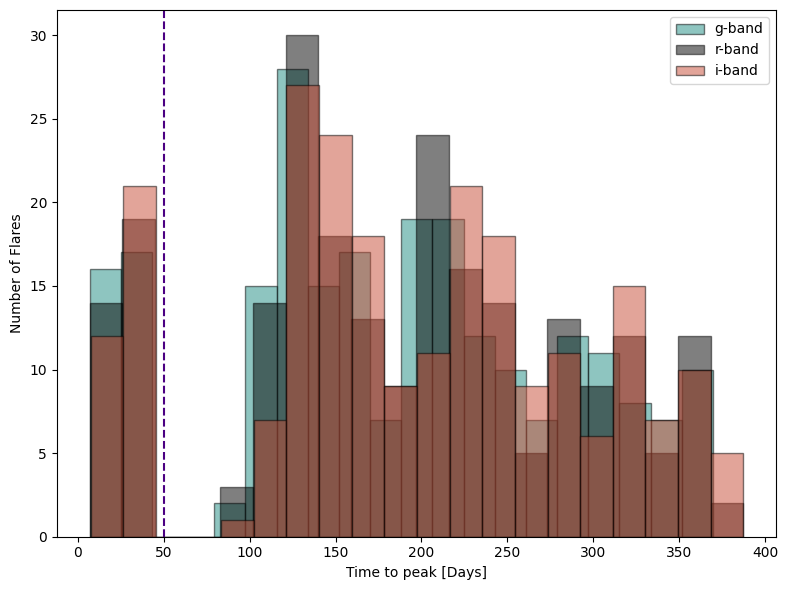

In [257]:
import matplotlib.pyplot as plt

# Assuming df_results contains columns: 'peak_mag_g', 'peak_mag_r', 'peak_mag_i'
bands = ['g', 'r', 'i']
import cmasher as cmr
colors = [cmr.wildfire(0.2), cmr.wildfire(0.5), cmr.wildfire(0.8)]

plt.figure(figsize=(8,6))

# Plot histogram for each band
for band, color in zip(bands, colors):
    plt.hist(
        df_results[f't_peak_{band}'].dropna(),
        bins=20,            # adjust bins as needed
        alpha=0.5,          # transparency for overlapping
        label=f'{band}-band',
        color=color,
        edgecolor='k'
    )

plt.xlabel("Time to peak [Days]")
plt.ylabel("Number of Flares")
plt.axvline(50,ls='--',color='indigo')
plt.legend()
plt.tight_layout()
plt.show()


In [304]:
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import cmasher as cmr

def plot_bbh_histograms(df, bands=['g', 'r', 'i'], colors=None):
    """
    Plots BBH light curve histograms side by side:
    - Left: Time to peak
    - Right: Peak apparent magnitude
    """
    t80_days = [3, 12, 28, 366, 371, 406, 407]


    if colors is None:
        # Default colors from cmasher
        colors = [cmr.ember(0.2), cmr.ember(0.5), cmr.ember(0.8)]

    fig, axes = plt.subplots(1, 2, figsize=(16,7))

    # Font sizes
    label_fs = 16
    tick_fs = 14
    legend_fs = 12
    # Add vertical lines for T80S observations
    label_t80 = ['T80-S obs','','','','','','']

    # --- Left panel: Time to peak ---
    for band, color in zip(bands, colors):
        axes[0].hist(
            df[f't_peak_{band}'].dropna(),
            bins=20,
            alpha=0.5,
            label=f'{band}-band',
            color=color,
            edgecolor='k'
        )
    f = 0
    for t_obs in t80_days:
        axes[0].axvline(t_obs, color='black', linestyle='--', alpha=0.5,label=label_t80[f])
        f=f+1
    axes[0].set_xlabel("Time to Peak [Days]", fontsize=label_fs)
    axes[0].set_ylabel("Number of BBH Simulations", fontsize=label_fs)
    axes[0].axvline(50, ls='--', color='indigo', label='t = 50 days')
    axes[0].legend(fontsize=legend_fs)
    axes[0].grid(True, alpha=0.3)
    axes[0].tick_params(axis='both', labelsize=tick_fs)

    # Increase tick frequency
    axes[0].xaxis.set_major_locator(MultipleLocator(50))
    axes[0].yaxis.set_major_locator(MultipleLocator(25))

    # --- Right panel: Peak magnitude ---
    for band, color in zip(bands, colors):
        axes[1].hist(
            df[f'peak_mag_{band}'].dropna(),
            bins=15,
            alpha=0.5,
            label=f'{band}-band',
            color=color,
            edgecolor='k'
        )

    axes[1].set_xlabel("Peak Apparent Magnitude", fontsize=label_fs)
    axes[1].set_ylabel("Number of BBH Simulations", fontsize=label_fs)
    axes[1].invert_xaxis()  # brighter to left
    axes[1].legend(fontsize=legend_fs)
    axes[1].grid(True, alpha=0.3)
    axes[1].tick_params(axis='both', labelsize=tick_fs)

    # Increase tick frequency
    axes[1].xaxis.set_major_locator(MultipleLocator(2))
    axes[1].yaxis.set_major_locator(MultipleLocator(25))

    plt.tight_layout()
    #plt.savefig('all_detectable_flares_jrr25.png', dpi=400)
    plt.show()


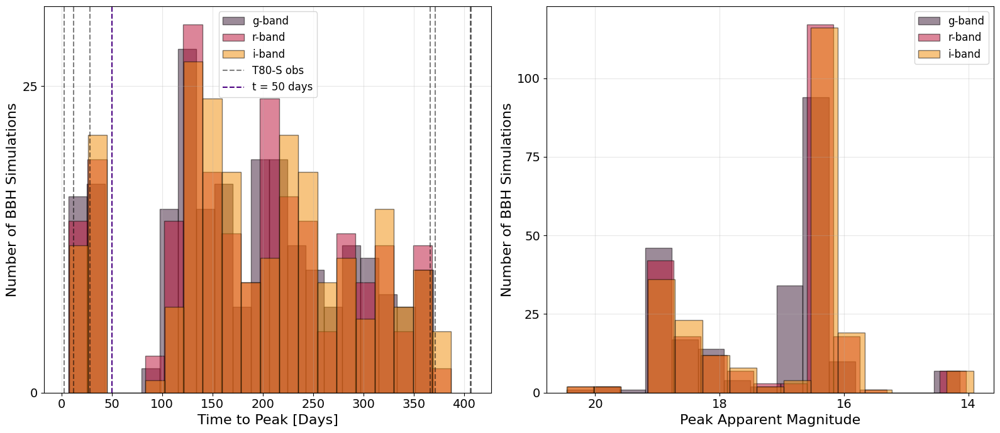

In [298]:
# Example usage
plot_bbh_histograms(df_results)

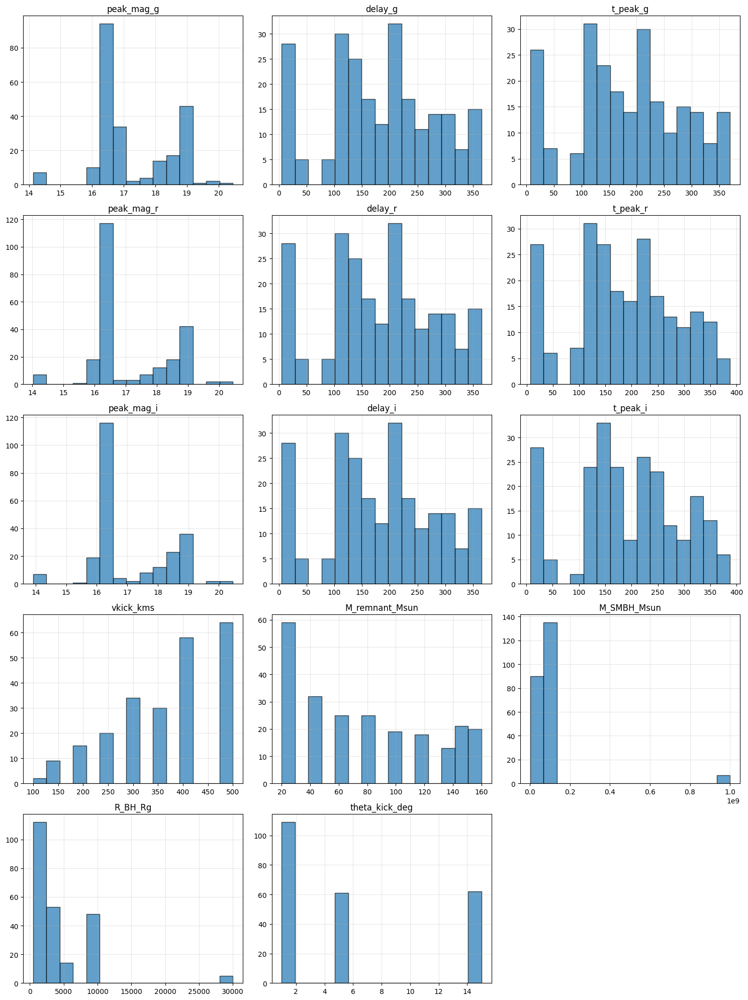

In [253]:
import matplotlib.pyplot as plt
import numpy as np

# List of columns to plot
columns = [
    'peak_mag_g', 'delay_g', 't_peak_g',
    'peak_mag_r', 'delay_r', 't_peak_r',
    'peak_mag_i', 'delay_i', 't_peak_i',
    'vkick_kms', 'M_remnant_Msun', 'M_SMBH_Msun', 'R_BH_Rg', 'theta_kick_deg'
]

n_cols = 3  # number of subplots per row
n_rows = int(np.ceil(len(columns)/n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
axes = axes.flatten()

for i, col in enumerate(columns):
    axes[i].hist(df_results[col].dropna(), bins=15, color='C0', edgecolor='k', alpha=0.7)
    axes[i].set_title(col)
    axes[i].grid(True, alpha=0.3)

# Hide any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# Analysis Referee Report S240413p

In [90]:
import numpy as np
import pandas as pd
GW_DL = 526 * 1e6  # pc
mu_GW = 5 * np.log10(GW_DL / 10)
def analyze_flare_constraints(files, mu_GW, m_lim=21.0, dt_threshold=0.5):
    """
    Extracts quantitative flare properties from simulation files and compares 
    them against an observational apparent magnitude limit.
    
    Parameters:
    -----------
    files : list
        List of file paths containing the light curve data.
    mu_GW : float
        Distance modulus used to convert absolute magnitudes to apparent magnitudes.
    m_lim : float, optional
        Observational limiting apparent magnitude (default is 21.0).
    dt_threshold : float, optional
        Brightness threshold (in magnitudes) relative to the peak used to 
        calculate the characteristic flare timescale (e.g., t_peak +/- dt_threshold).
        
    Returns:
    --------
    pd.DataFrame
        A DataFrame containing physical parameters, extracted metrics, and 
        observational constraint classifications for each simulation.
    """
    results = []

    for f in files:
        df = read_dat_with_metadata(f)
        params = parse_filename_params(f)

        df_clean = df.dropna(subset=['time', 'sdss_g']).copy()
        if df_clean.empty:
            continue

        t = pd.to_numeric(df_clean["time"]).values
        mag_abs = pd.to_numeric(df_clean['sdss_g']).values
        
        # Calculate apparent magnitude using the distance modulus
        mag_app = mag_abs + mu_GW

        # 1. Peak Flare Metrics (Note: lower magnitude = brighter)
        idx_peak = np.argmin(mag_app)
        peak_mag_abs = mag_abs[idx_peak]
        peak_mag_app = mag_app[idx_peak]
        t_peak = t[idx_peak]

        # 2. Timescale Metrics (Duration where flare is brighter than peak + dt_threshold)
        # This provides a proxy for the flare duration or "window of detectability"
        bright_indices = np.where(mag_app <= (peak_mag_app + dt_threshold))[0]
        if len(bright_indices) > 1:
            duration_peak = t[bright_indices[-1]] - t[bright_indices[0]]
        else:
            duration_peak = 0.0

        # 3. Observational Window (Total days the flare is actually brighter than the limit)
        detectable_indices = np.where(mag_app <= m_lim)[0]
        if len(detectable_indices) > 1:
            days_above_limit = t[detectable_indices[-1]] - t[detectable_indices[0]]
        elif len(detectable_indices) == 1:
            days_above_limit = 0.1 # Transient point spike
        else:
            days_above_limit = 0.0

        delta_mag = peak_mag_app - m_lim
        flux_ratio = 10**(-0.4 * delta_mag)
        
        if flux_ratio >= 6:
            constraint = "Securely Detectable"
        
        elif flux_ratio >= 2.5:
            constraint = "Robustly Detectable"
        
        elif flux_ratio >= 1.0:
            constraint = "Marginally Detectable"
        
        else:
            constraint = "Consistent with Non-Detection"

        # Aggregate row data
        row = {
            "vk_kms": params.get('vk_kms'),
            "M_BBH_Msun": params.get('M_BBH_Msun'),
            "M_SMBH_1e8": params.get('M_SMBH_Msun', 0) / 1e8,
            "R_BH": params.get('fas'),
            "theta_k_deg": params.get('theta_k_deg'),
            "peak_mag_abs": peak_mag_abs,
            "peak_mag_app": peak_mag_app,
            "t_peak": t_peak,
            f"duration_peak_dt_{dt_threshold}": duration_peak,
            "days_above_limit": days_above_limit,
            "constraint_status": constraint
        }
        results.append(row)

    df_results = pd.DataFrame(results)
    return df_results

In [91]:
len(results_table)

4320

In [107]:
results_table0 = results_table

results_table0.sort('Prob')
results_table0.reverse()

high_prob_df = results_table0[results_table0['Prob'] > 0]

high_prob_df = high_prob_df.to_pandas()

new_list = build_bbh_file_list(high_prob_df)


df_flare = analyze_flare_constraints(new_list,mu_GW)

In [108]:
df_flare

,vk_kms,M_BBH_Msun,M_SMBH_1e8,R_BH,theta_k_deg,peak_mag_abs,peak_mag_app,t_peak,duration_peak_dt_0.5,days_above_limit,constraint_status
0,250.0,100.0,1.00,3000.0,5.0,-22.196802,16.408126,310.806954,284.763221,284.763221,Securely Detectable
1,250.0,40.0,1.00,1000.0,5.0,-21.976080,16.628849,145.864593,307.247439,307.247439,Securely Detectable
2,400.0,100.0,1.00,3000.0,15.0,-21.955485,16.649444,218.754495,177.135786,177.135786,Securely Detectable
3,500.0,150.0,1.00,3000.0,5.0,-21.960569,16.644360,297.291927,452.046242,452.046242,Securely Detectable
4,500.0,60.0,1.00,1000.0,15.0,-21.925204,16.679725,120.759540,260.790089,260.790089,Securely Detectable
...,...,...,...,...,...,...,...,...,...,...,...
768,500.0,80.0,0.10,6000.0,1.0,-20.214515,18.390414,78.525911,36.254249,109.070374,Securely Detectable
769,500.0,60.0,0.01,10000.0,5.0,-17.922820,20.682108,18.185914,4.951903,4.244489,Marginally Detectable
770,500.0,80.0,0.10,6000.0,15.0,-19.436207,19.168722,64.163525,47.856877,47.856877,Robustly Detectable
771,500.0,60.0,1.00,500.0,15.0,-21.929590,16.675339,52.911162,113.431388,113.431388,Securely Detectable


In [109]:
len(new_list)

4320

In [110]:
df_flare['constraint_status'].value_counts()

constraint_status
Securely Detectable              621
Robustly Detectable              108
Marginally Detectable             30
Consistent with Non-Detection     14
Name: count, dtype: int64

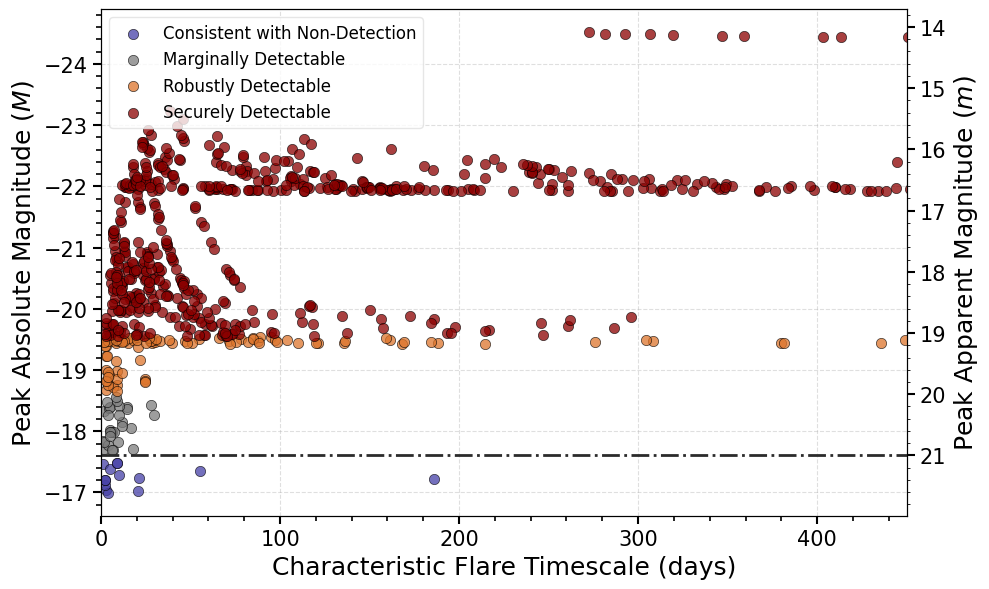

In [123]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator

def plot_flare_constraints(df_results, mu_GW, m_lim=21.0, timescale_col=None):
    """
    Plots flare characteristic timescale vs. peak absolute magnitude,
    with a twin axis for apparent magnitude and a horizontal line for the limiting magnitude.
    """
    fig, ax1 = plt.subplots(figsize=(10, 6), dpi=100)
    
    # 1. Identify the correct timescale column from your DataFrame
    if timescale_col is None:
        # Dynamically find the duration column if not specified
        time_cols = [c for c in df_results.columns if 'duration' in c or 'days_above' in c]
        timescale_col = time_cols[0] if time_cols else 'days_above_limit'

    # 2. Define a color mapping based on your constraint categories
    # Using a professional palette where ruled-out models pop visually
    import cmasher as cmr
    
    color_map = {
        "Securely Detectable": 'darkred',          # deep blue-purple
        "Robustly Detectable": cmr.sunburst(0.65),       # orange
        "Marginally Detectable": cmr.neutral(0.55),      # gray
        "Consistent with Non-Detection": cmr.freeze(0.35) # cyan/blue
    }
    # 3. Scatter plot grouped by constraint status for a clean legend
    plotted_labels = set()
    for status, group in df_results.groupby("constraint_status"):
        color = color_map.get(status, "#7f7f7f")
        ax1.scatter(
            group[timescale_col],
            group["peak_mag_abs"],
            color=color,
            alpha=0.75,
            edgecolors='k',
            linewidths=0.5,
            s=55,
            label=status,
            zorder=3
        )

    # 4. Configure Primary Y-Axis (Absolute Magnitude)
    ax1.set_xlabel("Characteristic Flare Timescale (days)", fontsize=18, fontweight='medium')
    ax1.set_ylabel("Peak Absolute Magnitude ($M$)", fontsize=18, fontweight='medium')
    ax1.tick_params(axis='both', which='major', labelsize=15, width=1.5, length=6)
    ax1.tick_params(axis='both', which='minor', width=1.2, length=3.5)
    ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
    ax1.grid(True, which='major', linestyle='--', alpha=0.4, zorder=1)
    
    # Invert Y-axis because lower magnitudes = brighter astronomical objects
    ax1.invert_yaxis()

    # 5. Configure Twin Y-Axis (Apparent Magnitude)
    ax2 = ax1.twinx()
    y1, y2 = ax1.get_ylim()
    # Apply the distance modulus to line up the scales perfectly
    ax2.set_ylim(y1 + mu_GW, y2 + mu_GW) 
    ax2.set_ylabel("Peak Apparent Magnitude ($m$)", fontsize=18, fontweight='medium')
    ax2.tick_params(axis='y', which='major', labelsize=15, width=1.5, length=6)
    ax2.yaxis.set_minor_locator(AutoMinorLocator(5))

    # 6. Draw the Observational Limiting Magnitude Line
    # Note: Plotted on ax2 since it is defined in apparent magnitude units
    ax2.axhline(
        y=m_lim, 
        color="#2b2b2b", 
        linestyle="-.", 
        linewidth=2, 
        zorder=2
    )

    # 7. Formatting Legends & Layout
    # Merge legends from both axes seamlessly
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    
    ax1.legend(
        lines + lines2, 
        labels + labels2,
        fontsize=12,
        frameon=True,
        facecolor='white',
        edgecolor='#e0e0e0',
        loc='upper left',
        ncol=1,
    )

    plt.tight_layout()
    plt.xlim(-0.1,450)
    
    return fig, ax1, ax2

# --- Example Usage ---
fig, ax1, ax2 = plot_flare_constraints(df_flare, mu_GW, m_lim=21.0)
plt.savefig('allflares_png',dpi=300)
plt.show()

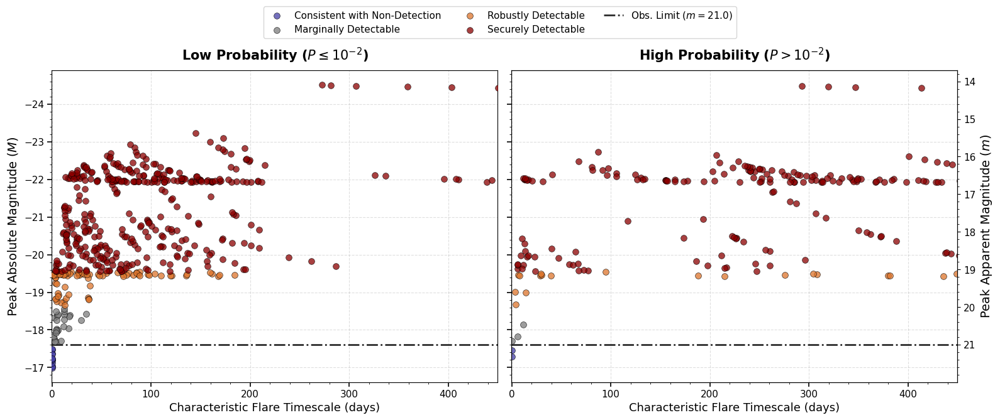

In [124]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator

def plot_side_by_side_constraints(results_table, mu_GW, m_lim=21.0):
    """
    Splits data by a probability threshold of 0.01 and generates side-by-side
    comparison plots of characteristic timescale vs. peak absolute magnitude.
    """
    # 1. Pipeline Data Split
    results_df = results_table.to_pandas() if hasattr(results_table, 'to_pandas') else pd.DataFrame(results_table)
    
    # Generate mock files/runs for the two subsets to feed into your analysis engine
    # Adjust this line if you pull data directly from pre-computed tables rather than file lists
    high_prob_files = build_bbh_file_list(results_df[results_df['Prob'] > 1e-2])
    low_prob_files = build_bbh_file_list(results_df[results_df['Prob'] <= 1e-2])
    
    df_high = analyze_flare_constraints(high_prob_files, mu_GW, m_lim=m_lim)
    df_low = analyze_flare_constraints(low_prob_files, mu_GW, m_lim=m_lim)
    
    # 2. Setup Figure
    fig, (ax_l, ax_r) = plt.subplots(1, 2, figsize=(16, 7), sharey=True, dpi=100)
    
    import cmasher as cmr
    
    color_map = {
        "Securely Detectable": 'darkred',          # deep blue-purple
        "Robustly Detectable": cmr.sunburst(0.65),       # orange
        "Marginally Detectable": cmr.neutral(0.55),      # gray
        "Consistent with Non-Detection": cmr.freeze(0.35) # cyan/blue
    }
    datasets = [
        (df_low, ax_l, r"Low Probability ($P \leq 10^{-2}$)"), 
        (df_high, ax_r, r"High Probability ($P > 10^{-2}$)")
    ]
    
    # Determine global limits for timescale (X-axis) to maintain symmetry
    max_time = max(df_high['days_above_limit'].max(), df_low['days_above_limit'].max(), 10) * 1.1

    # 3. Plotting Loop
    for df, ax, title in datasets:
        if df.empty:
            ax.text(0.5, 0.5, "No Models Available", ha='center', va='center', fontsize=14)
            continue
            
        for status, group in df.groupby("constraint_status"):
            ax.scatter(
                group["days_above_limit"],
                group["peak_mag_abs"],
                color=color_map.get(status, "#7f7f7f"),
                alpha=0.75, edgecolors='k', linewidths=0.5, s=50,
                label=status, zorder=3
            )
            
        # Axis labels and adjustments
        ax.set_title(title, fontsize=15, fontweight='bold', pad=12)
        ax.set_xlabel("Characteristic Flare Timescale (days)", fontsize=13)
        ax.set_xlim(-0.05 * max_time, max_time)
        ax.tick_params(axis='both', which='major', labelsize=11, width=1.2, length=5)
        ax.xaxis.set_minor_locator(AutoMinorLocator(5))
        ax.yaxis.set_minor_locator(AutoMinorLocator(5))
        ax.grid(True, which='major', linestyle='--', alpha=0.4, zorder=1)

    # 4. Invert Primary Y scale (shared)
    ax_l.set_ylabel("Peak Absolute Magnitude ($M$)", fontsize=14)
    ax_l.set_xlim(-0.1,450)
    ax_l.invert_yaxis()
    
    # 5. Dual Y-Axis (Apparent Magnitude) on the far right
    ax2 = ax_r.twinx()
    y1, y2 = ax_r.get_ylim()
    ax2.set_ylim(y1 + mu_GW, y2 + mu_GW)
    ax2.set_xlim(-0.1,450)
    ax2.set_ylabel("Peak Apparent Magnitude ($m$)", fontsize=14)
    ax2.tick_params(axis='y', which='major', labelsize=11)
    ax2.yaxis.set_minor_locator(AutoMinorLocator(5))
    
    # 6. Observational Limit Benchmark Across Both Plot Fields
    ax2.axhline(y=m_lim, color="#2b2b2b", linestyle="-.", linewidth=2, label=f"Obs. Limit ($m = {m_lim}$)", zorder=2)
    ax_l.axhline(y=m_lim-mu_GW, color="#2b2b2b", linestyle="-.", linewidth=2, zorder=2)
    
    # 7. Unified Legends
    handles1, labels1 = ax_l.get_legend_handles_labels()
    handles2, labels2 = ax2.get_legend_handles_labels()
    # Deduplicate legend items
    by_label = dict(zip(labels1 + labels2, handles1 + handles2))
    
    fig.legend(by_label.values(), by_label.keys(), loc='upper center', 
               bbox_to_anchor=(0.5, 0.96), ncol=3, fontsize=11, frameon=True)
    
    plt.tight_layout(rect=[0, 0, 1, 0.88])
    return fig

# Execution
fig = plot_side_by_side_constraints(results_table, mu_GW=mu_GW, m_lim=21.0)
plt.show()